In [1]:
# --- Core Python Libraries ---
import os
import math

# --- Data Processing ---
import numpy as np
import pandas as pd
import h5py

# --- Plotting ---
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.patches import Rectangle

# --- Deep Learning: PyTorch & TorchVision ---
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

# --- Metrics ---
from scipy.stats import spearmanr

import seaborn as sns

In [2]:
nb_type = "Train"

In [3]:
file_path = "./data/elucidata_ai_challenge_data.h5"
with h5py.File(file_path, "r") as f:
    train_images = {k: np.array(v) for k, v in f["images/Train"].items()}
    train_spots  = {k: np.array(v) for k, v in f["spots/Train"].items()}
    test_images  = {k: np.array(v) for k, v in f["images/Test"].items()}
    test_spots   = {k: np.array(v) for k, v in f["spots/Test"].items()}

In [4]:
# 🛠️ Explore Data - Cleaned Version

print("🏋️‍♀️ Train Slides Overview")
print("------------------------")
for name in train_images.keys():
    img_shape = train_images[name].shape
    spot_count = len(train_spots[name])
    spot_fields = train_spots[name].dtype.names
    print(f"Slide {name}:")
    print(f"  📷 Image Shape : {img_shape}")
    print(f"  🧬 Spot Count  : {spot_count}")
    print(f"  🧩 Spot Fields : {spot_fields}")
    print("")

print("\n🎯 Test Slide Overview")
print("------------------------")
for name in test_images.keys():
    img_shape = test_images[name].shape
    spot_count = len(test_spots[name])
    spot_fields = test_spots[name].dtype.names
    print(f"Slide {name}:")
    print(f"  📷 Image Shape : {img_shape}")
    print(f"  🧬 Spot Count  : {spot_count}")
    print(f"  🧩 Spot Fields : {spot_fields}")
    print("")

🏋️‍♀️ Train Slides Overview
------------------------
Slide S_1:
  📷 Image Shape : (2000, 1974, 3)
  🧬 Spot Count  : 2197
  🧩 Spot Fields : ('x', 'y', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C20', 'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29', 'C30', 'C31', 'C32', 'C33', 'C34', 'C35')

Slide S_2:
  📷 Image Shape : (2000, 1988, 3)
  🧬 Spot Count  : 2270
  🧩 Spot Fields : ('x', 'y', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C20', 'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29', 'C30', 'C31', 'C32', 'C33', 'C34', 'C35')

Slide S_3:
  📷 Image Shape : (2000, 1966, 3)
  🧬 Spot Count  : 690
  🧩 Spot Fields : ('x', 'y', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C20', 'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C2

In [5]:
import pandas as pd
import numpy as np

def check_missing_values(spots_dict, label):
    print(f"\n🔎 Checking for missing values in {label}...")
    for slide_name, slide_data in spots_dict.items():
        # Convert structured array to DataFrame for easy check
        df = pd.DataFrame(slide_data)
        
        missing = df.isnull().sum().sum()  # total missing values
        nans = np.isnan(df.values).sum()   # total NaNs (just to be safe)
        
        if missing > 0 or nans > 0:
            print(f"🚨 Slide {slide_name}: {missing} missing, {nans} NaN values found!")
        else:
            print(f"✅ Slide {slide_name}: No missing or NaN values.")

# Run on both train and test
check_missing_values(train_spots, "Train Spots")
check_missing_values(test_spots, "Test Spots")


🔎 Checking for missing values in Train Spots...
✅ Slide S_1: No missing or NaN values.
✅ Slide S_2: No missing or NaN values.
✅ Slide S_3: No missing or NaN values.
✅ Slide S_4: No missing or NaN values.
✅ Slide S_5: No missing or NaN values.
✅ Slide S_6: No missing or NaN values.

🔎 Checking for missing values in Test Spots...
✅ Slide S_7: No missing or NaN values.


col, row: 2 3
row, col position for slide S_1 0 0
row, col position for slide S_2 0 1
row, col position for slide S_3 1 0
row, col position for slide S_4 1 1
row, col position for slide S_5 2 0
row, col position for slide S_6 2 1


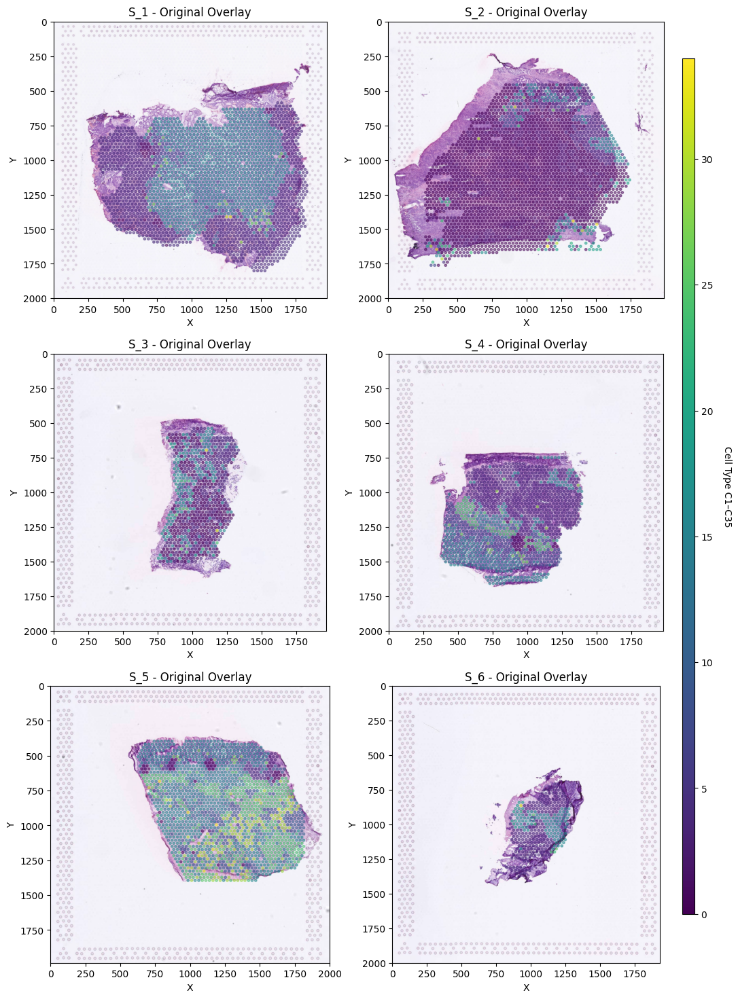

In [6]:
if nb_type == "Train":
    # 🎯 Set up colormap and normalization
    norm = plt.Normalize(0, 34)
    cmap = cm.viridis
    print(cmap)
    print(norm)

    # 🔢 Layout: number of slides per row
    slides = list(train_images.keys())
    n_cols = 2
    n_rows = int(np.ceil(len(slides) / n_cols))
    print("col, row:", n_cols, n_rows)

    # 🎨 Create figure and axes grid (extra column for colorbar)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 6 * n_rows), squeeze=False)

    # 🔄 Plot each slide
    for idx, slide in enumerate(slides):
        row, col = divmod(idx, n_cols)
        print(f"row, col position for slide {slide}", row, col)
        ax = axes[row, col]

        img = train_images[slide]
        spots = train_spots[slide]
        ct_cols = [f"C{j}" for j in range(1, 36)]
        ct_vals = np.vstack([spots[c] for c in ct_cols]).T
        dom = ct_vals.argmax(axis=1)


        ax.imshow(img)
        ax.scatter(spots["x"], spots["y"], c=dom, cmap=cmap, norm=norm, s=6, alpha=0.5)
        ax.set_title(f"{slide} - Original Overlay")
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_xlim(0, img.shape[1])
        ax.set_ylim(img.shape[0], 0)

    # ❌ Hide any unused axes
    for r in range(n_rows):
        for c in range(n_cols):
            idx = r * n_cols + c
            if idx >= len(slides):
                axes[r, c].axis("off")

    # 🎯 Add one clean shared colorbar to the right
    fig.subplots_adjust(right=0.88)  # leave space for colorbar
    cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
    cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax)
    cbar.set_label("Cell Type C1–C35", rotation=270, labelpad=20)

    # 🧼 Title and layout
    plt.show()

C:\Users\PilockHulmes\AppData\Local\Temp\ipykernel_18592\3105089394.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Dominant_Cell_Type', order=[f"C{i}" for i in range(1,36)], ax=ax, palette="viridis")
C:\Users\PilockHulmes\AppData\Local\Temp\ipykernel_18592\3105089394.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Dominant_Cell_Type', order=[f"C{i}" for i in range(1,36)], ax=ax, palette="viridis")
C:\Users\PilockHulmes\AppData\Local\Temp\ipykernel_18592\3105089394.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



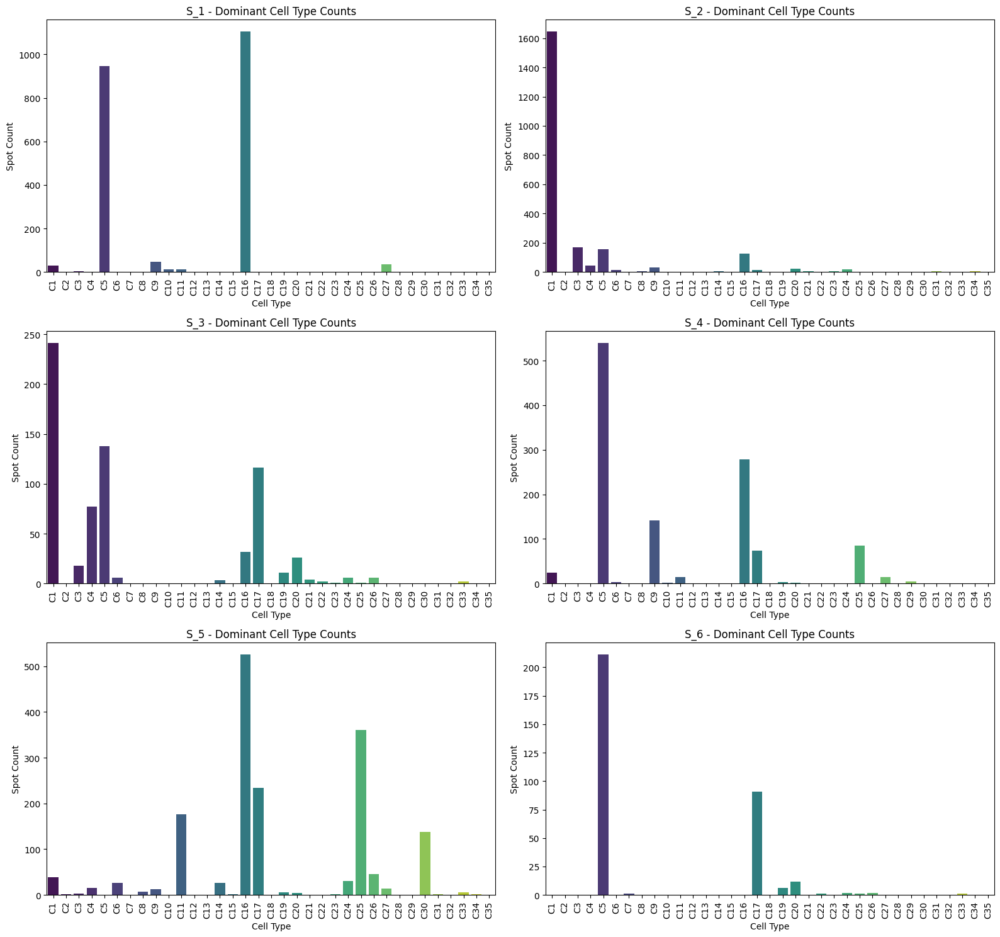

In [7]:
if nb_type == "Train":
    slides = list(train_images.keys())
    n_cols = 2
    n_rows = int(np.ceil(len(slides) / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(8 * n_cols, 5 * n_rows), squeeze=False)

    for idx, slide in enumerate(slides):
        row, col = divmod(idx, n_cols)
        ax = axes[row, col]

        spots = train_spots[slide]
        ct_cols = [f"C{j}" for j in range(1, 36)]

        # Get dominant cell type for each spot
        ct_vals = np.vstack([spots[c] for c in ct_cols]).T
        dom = ct_vals.argmax(axis=1)  # values between 0 and 34

        # Prepare DataFrame
        df = pd.DataFrame({'Dominant_Cell_Type': dom})
        df['Dominant_Cell_Type'] = df['Dominant_Cell_Type'].apply(lambda x: f"C{x+1}")

        # Plot countplot
        sns.countplot(data=df, x='Dominant_Cell_Type', order=[f"C{i}" for i in range(1,36)], ax=ax, palette="viridis")
        ax.set_title(f"{slide} - Dominant Cell Type Counts")
        ax.set_xlabel("Cell Type")
        ax.set_ylabel("Spot Count")
        ax.tick_params(axis='x', rotation=90)

    # ❌ Hide empty axes if any
    for r in range(n_rows):
        for c in range(n_cols):
            idx = r * n_cols + c
            if idx >= len(slides):
                axes[r, c].axis("off")

    plt.tight_layout()
    plt.show()

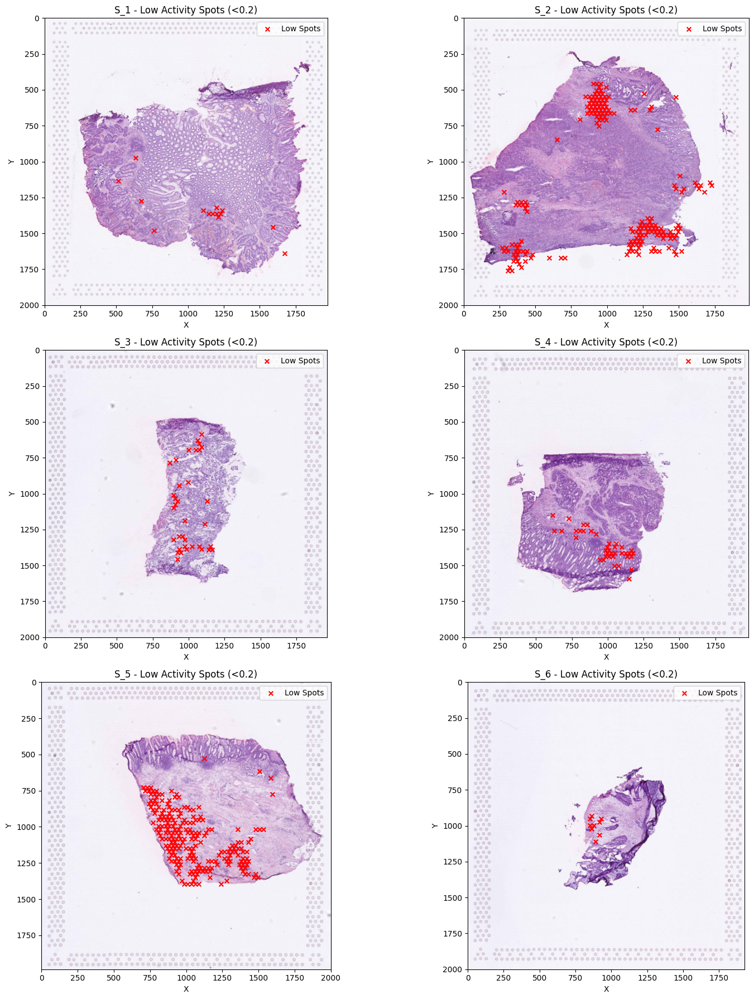

In [8]:
if nb_type == "Train":

    threshold = 0.2

    ct_cols = [f"C{j}" for j in range(1, 36)]
    zero_spots_info = []  # to collect (slide, x, y, ct_values)

    for slide, spots in train_spots.items():
        # Stack (n_spots, 35)
        ct_vals = np.vstack([spots[c] for c in ct_cols]).T

        # Find spots where ALL C1–C35 < threshold
        is_all_zero = (ct_vals < threshold).all(axis=1)

        # Save spots info
        for idx in np.where(is_all_zero)[0]:
            zero_spots_info.append({
                "slide": slide,
                "x": spots["x"][idx],
                "y": spots["y"][idx],
                "ct_vals": ct_vals[idx]
            })

    # 🖼️ Plot for each slide - Marking these spots
    slides_with_zeros = sorted(set([item["slide"] for item in zero_spots_info]))

    # Setup 2 slides per row
    cols = 2
    rows = (len(slides_with_zeros) + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(16, 6 * rows))
    axes = axes.flatten()

    for idx, slide in enumerate(slides_with_zeros):
        img = train_images[slide]
        spots = train_spots[slide]
        
        ax = axes[idx]
        ax.imshow(img)
        ax.set_title(f"{slide} - Low Activity Spots (<{threshold})", fontsize=12)
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        
        # Mark zero-like spots
        xs = [s["x"] for s in zero_spots_info if s["slide"] == slide]
        ys = [s["y"] for s in zero_spots_info if s["slide"] == slide]
        ax.scatter(xs, ys, color='red', s=30, marker='x', label='Low Spots')
        
        ax.set_xlim(0, img.shape[1])
        ax.set_ylim(img.shape[0], 0)
        ax.legend()

    # Hide extra empty plots
    for j in range(idx+1, len(axes)):
        axes[j].axis('off')

    fig.tight_layout()
    plt.show()

In [9]:
if nb_type == "Train":
    # 🎯 Plot distribution of each zero-like spot (5 per row)

    n = len(zero_spots_info)
    cols = 5
    rows = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    axes = axes.flatten()

    for idx, info in enumerate(zero_spots_info):
        ax = axes[idx]
        ax.bar(range(1, 36), info["ct_vals"], color=plt.cm.viridis(np.linspace(0,1,35)))
        ax.set_title(f"{info['slide']} | x={info['x']} | y={info['y']}", fontsize=8)
        ax.set_xticks(range(1,36))
        ax.set_xticklabels([f"C{j}" for j in range(1,36)], rotation=90, fontsize=6)
        ax.set_ylim(0, threshold*1.5)

    # Hide extra empty plots
    for j in range(idx+1, len(axes)):
        axes[j].axis('off')

    fig.tight_layout()
    plt.show()

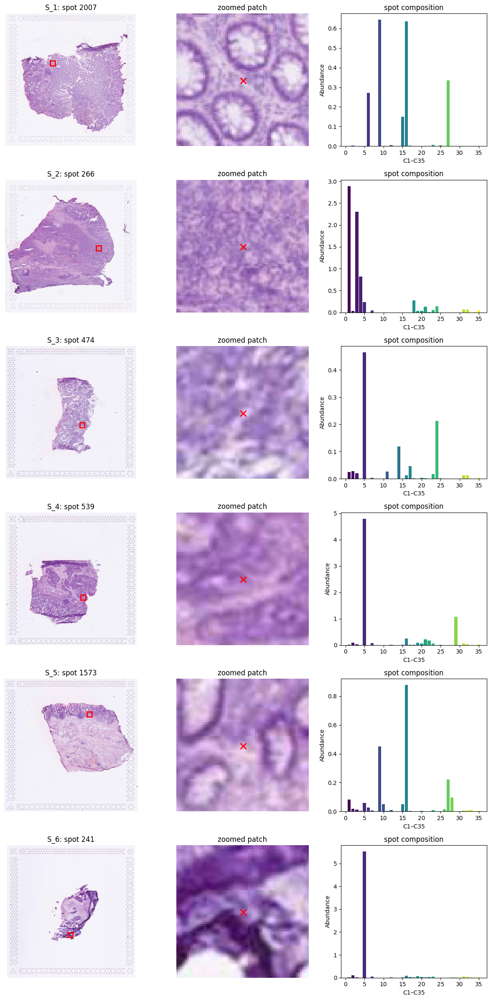

In [10]:
if nb_type == "Train":
    patch_w = patch_h = 75

    fig, axes = plt.subplots(len(train_images), 3, figsize=(12, 4*len(train_images)))
    for i, slide in enumerate(train_images):
        img = train_images[slide]
        spots = train_spots[slide]
        # pick a random spot
        idx = np.random.randint(len(spots))
        x0, y0 = spots["x"][idx], spots["y"][idx]
        vals = [spots[f"C{j}"][idx] for j in range(1, 36)]
        
        # compute patch bounds (clamped)
        x1 = max(0, x0 - patch_w//2)
        x2 = min(img.shape[1], x0 + patch_w//2)
        y1 = max(0, y0 - patch_h//2)
        y2 = min(img.shape[0], y0 + patch_h//2)

        # 1) Full slide with red rectangle
        ax = axes[i, 0]
        ax.imshow(img)
        rect = Rectangle((x1, y1), x2-x1, y2-y1,
                         linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.set_title(f"{slide}: spot {idx}")
        ax.axis("off")
        
        # 2) Zoomed patch with a cross at the exact spot
        ax = axes[i, 1]
        patch = img[y1:y2, x1:x2]
        ax.imshow(patch)
        # spot relative to patch
        rel_x = x0 - x1
        rel_y = y0 - y1
        ax.scatter(rel_x, rel_y, marker='x', color='red', s=100, lw=2)
        ax.set_title("zoomed patch")
        ax.axis("off")
        
        # 3) Bar of that spot’s distribution
        ax = axes[i, 2]
        ax.bar(range(1, 36), vals, color=cm.viridis(np.linspace(0, 1, 35)))
        ax.set_xlabel("C1–C35")
        ax.set_ylabel("Abundance")
        ax.set_title("spot composition")

    fig.tight_layout()
    plt.show()

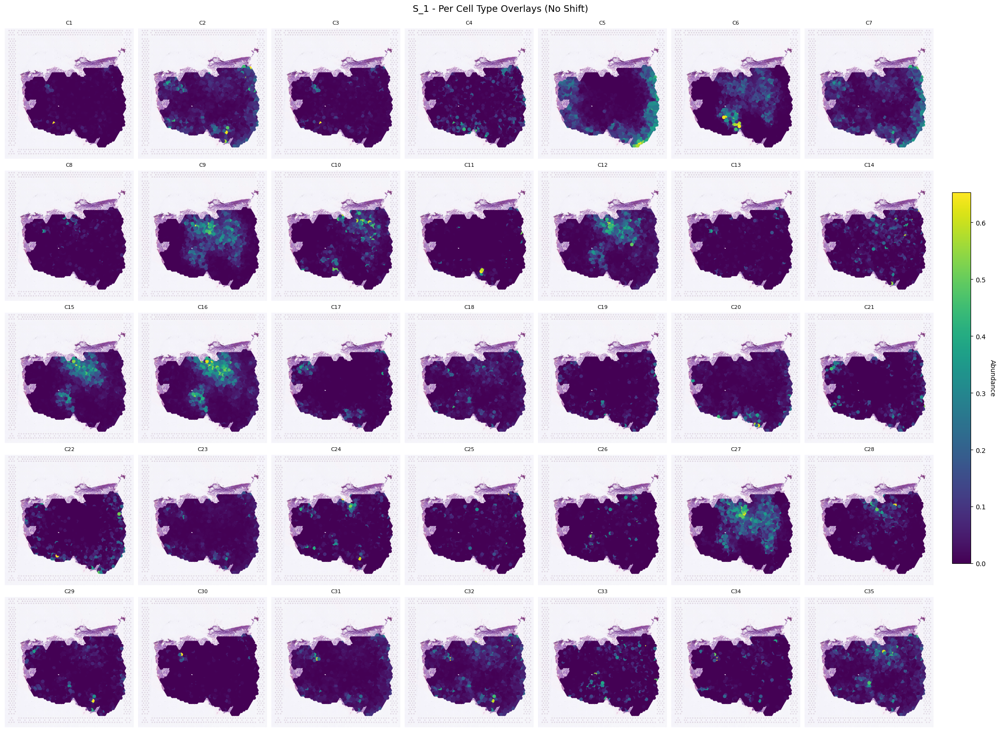

In [11]:
if nb_type == "Train":
    import numpy as np
    import matplotlib.pyplot as plt

    slide = "S_1"  # or whichever slide you want to visualize
    img = train_images[slide]
    spots = train_spots[slide]

    ct_cols = [f"C{j}" for j in range(1, 36)]
    n_cols = 7
    n_rows = int(np.ceil(35 / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(3 * n_cols, 3 * n_rows), constrained_layout=True)
    axes = axes.flatten()

    for idx, ct in enumerate(ct_cols):
        ax = axes[idx]
        ax.imshow(img)
        sc = ax.scatter(
            spots["x"], spots["y"],   
            c=spots[ct], cmap="viridis", s=20, vmin=0, vmax=spots[ct].max()
        )
        ax.set_title(ct, fontsize=8)
        ax.axis("off")

    # Turn off extra axes
    for j in range(idx + 1, n_rows * n_cols):
        axes[j].axis('off')

    # Shared colorbar
    cbar = fig.colorbar(sc, ax=axes.tolist(), orientation='vertical', fraction=0.02, pad=0.02)
    cbar.set_label("Abundance", rotation=270, labelpad=15)

    fig.suptitle(f"{slide} - Per Cell Type Overlays (No Shift)", y=1.02, fontsize=14)
    plt.show()

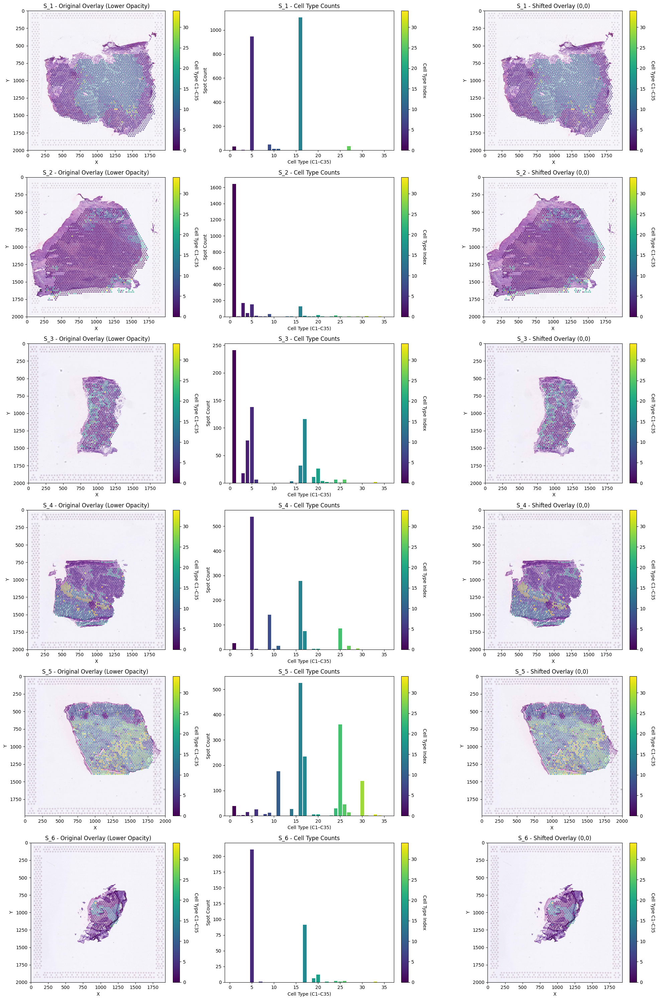

In [19]:
# Define per-slide shifts:
shifts = {
    "S_1": (-65, -70),
    "S_2": (-85,-70),
    "S_3": (-20,-25),
    "S_4": (0, 0),
    "S_5": (0, 0),
    "S_6": (-20,0),
}

# shifts = {
#     "S_1": (0, 0),
#     "S_2": (0,0),
#     "S_3": (0,0),
#     "S_4": (0, 0),
#     "S_5": (0, 0),
#     "S_6": (0,0),
# }


fig, axes = plt.subplots(len(train_images), 3, figsize=(20, 5 * len(train_images)))

for i, slide in enumerate(train_images):
    img = train_images[slide]
    spots = train_spots[slide]
    ct_cols = [f"C{j}" for j in range(1, 36)]
    ct_vals = np.vstack([spots[c] for c in ct_cols]).T
    dom = ct_vals.argmax(axis=1)

    dx, dy = shifts.get(slide, (0, 0))

    # Pre-compute axis limits based on image size
    height, width = img.shape[:2]
    xlims = (0, width)
    ylims = (height, 0)  # y grows downward for images

    # 1a) Original overlay (reduced opacity)
    ax = axes[i, 0]
    im0 = ax.imshow(img)
    sc0 = ax.scatter(spots["x"], spots["y"], c=dom, cmap="viridis", s=4, alpha=0.5)
    ax.set_title(f"{slide} - Original Overlay (Lower Opacity)")
    ax.set_xlim(xlims)
    ax.set_ylim(ylims)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    cbar0 = fig.colorbar(cm.ScalarMappable(cmap="viridis", norm=plt.Normalize(0,34)),
                         ax=ax, fraction=0.046, pad=0.04)
    cbar0.set_label("Cell Type C1–C35", rotation=270, labelpad=20)

    # 1b) Dominant cell-type count plot
    ax = axes[i, 1]
    counts = np.bincount(dom, minlength=35)
    colors = cm.viridis(np.linspace(0, 1, 35))
    ax.bar(range(1, 36), counts, color=colors)
    ax.set_xlabel("Cell Type (C1–C35)")
    ax.set_ylabel("Spot Count")
    ax.set_title(f"{slide} - Cell Type Counts")
    # Gradient box for count bar
    cbar1 = fig.colorbar(cm.ScalarMappable(cmap="viridis", norm=plt.Normalize(0,34)),
                         ax=ax, fraction=0.046, pad=0.04)
    cbar1.set_label("Cell Type Index", rotation=270, labelpad=20)

    # 1c) Shifted overlay (full opacity)
    ax = axes[i, 2]
    im2 = ax.imshow(img)
    sc2 = ax.scatter(spots["x"] + dx, spots["y"] + dy, c=dom, cmap="viridis", s=4, alpha=0.5)
    ax.set_title(f"{slide} - Shifted Overlay ({dx},{dy})")
    ax.set_xlim(xlims)
    ax.set_ylim(ylims)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    cbar2 = fig.colorbar(cm.ScalarMappable(cmap="viridis", norm=plt.Normalize(0,34)),
                         ax=ax, fraction=0.046, pad=0.04)
    cbar2.set_label("Cell Type C1–C35", rotation=270, labelpad=20)

fig.tight_layout()

In [20]:
#########################
# 0. Imports & Settings #
#########################
import os, math, random, time, gc, sys
from pathlib import Path
from typing import Dict, Tuple, List
from skimage import color
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import h5py
from tqdm.auto import tqdm
from PIL import Image
from scipy.stats import spearmanr

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from transformers import AutoImageProcessor, AutoModel
from torchvision.models import convnext_large, ConvNeXt_Large_Weights

TTA_TFMS = [
    transforms.Lambda(lambda x: x),                                    # identity
    transforms.Lambda(lambda x: torch.flip(x, dims=[-1])),            # horizontal
    transforms.Lambda(lambda x: torch.flip(x, dims=[-2])),            # vertical
    transforms.Lambda(lambda x: x.rot90(1, dims=[-2,-1])),            # rotate 90°
    transforms.Lambda(lambda x: x.rot90(2, dims=[-2,-1])),            # rotate 180°
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2)
]


#####################
# 1. Top‑Level Config
#####################
class CFG:
    # ---- paths ----
    DATA_PATH = Path("./data/elucidata_ai_challenge_data.h5")
    MODEL_DIR = Path("./data/owkinphikon-v2/")  # <-- private dataset with HF weights
    CACHE_DIR = Path("./data/cache/")  # where to save pre‑computed features
    SUBMISSION_FILE = Path("./submission.csv")

    # ---- training control ----
    VAL_SLIDE = "S_6"          # slide held out for validation
    FREEZE_ENCODER = True       # freeze Phikon weights
    PATCH_SIZE = 78  
    PATCH_SCALES = [1.0, 2.0, 3.0]  # pixel size of square patch per spot
    K_NEIGHBORS = 4             # K in KNN graph
    GNN_LAYERS = 2            # depth of GraphSAGE
    HIDDEN_DIM = 1024            # hidden dim inside GNN
    DROPOUT = 0.5
    EPOCHS = 100
    LR = 1e-4
    WEIGHT_DECAY = 1e-3
    SEED = 42
    FREEZE_ENCODER    = False      # allow fine-tuning
    UNFREEZE_LAST_N   = 1000          # number of last transformer blocks to unfreeze
    POS_ENC_DIM       = 1024         # dimensionality of (x,y) embedding
    ADJ_SIGMA         = 50.0       # Gaussian sigma for adjacency weighting
    USE_AMP           = False       # enable mixed precision
    AUGMENT           = True       # enable patch augmentation
    USE_CONVNEXT = True
    USE_SLIDE_EMB = True   # turn slide-ID embedding on/off
    USE_GNN       = True    # if False, will use a simple MLP instead of GraphNet
    CV_FOLDS      = 5       # number of stratified spot-level CV folds

    REF_MEANS = None
    REF_STDS  = None

    # batch used only for encoder feature extraction
    BATCH_SIZE_FE = 128
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    # manual alignment shifts per slide
    SHIFTS = {"S_1": (-65,-70), "S_2": (0,0), "S_3": (0,0), "S_4": (0,0), "S_5": (0,0), "S_6": (0,0)}
    #SHIFTS = {"S_1": (0,0), "S_2": (0,0), "S_3": (0,0), "S_4": (0,0), "S_5": (0,0), "S_6": (0,0)}

############################
# 2. Reproducibility Helpers
############################

def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(CFG.SEED)
CFG.CACHE_DIR.mkdir(parents=True, exist_ok=True)

#########################
# 3. Data‑Loading Helpers
#########################

def load_h5(path: Path):
    with h5py.File(path, "r") as f:
        train_images = {k: np.array(v) for k, v in f["images/Train"].items()}
        train_spots  = {k: np.array(v) for k, v in f["spots/Train"].items()}
        test_images  = {k: np.array(v) for k, v in f["images/Test"].items()}
        test_spots   = {k: np.array(v) for k, v in f["spots/Test"].items()}
    return train_images, train_spots, test_images, test_spots

#################################
# 4. Patch Extraction & Encoding #
#################################

class MLPHead(nn.Module):
    def __init__(self, in_dim, hidden, out_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden),
            nn.ReLU(),
            nn.Linear(hidden, out_dim),
        )
    def forward(self, x, *_):
        return self.net(x)

def train_loop_mlp(model, loader, opt, crit, ep):
    model.train(); total=0
    for x,y in loader:
        x,y = x.to(CFG.DEVICE), y.to(CFG.DEVICE)
        opt.zero_grad()
        loss = crit(model(x), y)
        loss.backward(); opt.step()
        total += loss.item()
    return total/len(loader)

def validate_mlp(model, loader, crit):
    model.eval()
    losses, spears = [], []
    with torch.no_grad():
        for x,y in loader:
            x,y = x.to(CFG.DEVICE), y.to(CFG.DEVICE)
            pred = model(x)
            losses.append(crit(pred,y).item())
            spears.append(spearman_torch(pred,y))
    return np.mean(losses), np.mean(spears)

from torchvision import transforms

aug_tfms = transforms.Compose([
    transforms.ToTensor(),
    # strong color jitter + hue
    transforms.RandomApply(
        [transforms.ColorJitter(
            brightness=0.4,
            contrast=0.4,
            saturation=0.4,
            hue=0.1
        )],
        p=0.8
    ),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=45),
    transforms.RandomAffine(
        degrees=0,
        translate=(0.1, 0.1),
        scale=(0.9, 1.1)
    ),
    transforms.RandomErasing(
        p=0.3,
        scale=(0.02, 0.15),
        ratio=(0.3, 3.3)
    ),
    transforms.ToPILImage(),
])

def extract_patch(img: np.ndarray, xy: Tuple[int,int], size: int = 224) -> Image.Image:
    x, y = int(xy[0]), int(xy[1])
    h, w, _ = img.shape
    half = size // 2
    x1, x2 = x - half, x + half
    y1, y2 = y - half, y + half

    # crop with zero‐padding at borders
    patch = np.zeros((size, size, 3), dtype=img.dtype)
    x1_src, y1_src = max(0, x1), max(0, y1)
    x2_src, y2_src = min(w, x2), min(h, y2)
    x1_dst, y1_dst = x1_src - x1, y1_src - y1
    x2_dst, y2_dst = x1_dst + (x2_src - x1_src), y1_dst + (y2_src - y1_src)
    patch[y1_dst:y2_dst, x1_dst:x2_dst] = img[y1_src:y2_src, x1_src:x2_src]

    # convert & optionally augment
    patch_img = Image.fromarray(patch.astype(np.uint8))

    if CFG.AUGMENT:
        patch_img = aug_tfms(patch_img)
    return patch_img


def precompute_features(train_images, train_spots, test_images, test_spots):
    #feat_file = CFG.CACHE_DIR / "spot_features.npz"
    feat_file = Path("./data/features/spot_features_123x.npz")
    if feat_file.exists():
        print("🔄 Using cached features …")
        cache = np.load(feat_file, allow_pickle=True)
        return cache["train_feats"].item(), cache["test_feats"].item()

    processor = AutoImageProcessor.from_pretrained(CFG.MODEL_DIR, local_files_only=True)
    encoder = AutoModel.from_pretrained(CFG.MODEL_DIR, local_files_only=True)
    encoder.to(CFG.DEVICE)

    # --- ConvNeXt-small backbone ---
    if CFG.USE_CONVNEXT:
        # switch to ConvNeXt-Large
        cn_weights = ConvNeXt_Large_Weights.IMAGENET1K_V1
        convnext   = convnext_large(weights=cn_weights).to(CFG.DEVICE)
        convnext.eval()
        # freeze parameters
        for p in convnext.parameters():
            p.requires_grad = False

        # normalization for ConvNeXt
        cn_tfms = ConvNeXt_Large_Weights.IMAGENET1K_V1.transforms()
    
    # Freeze/fine-tune logic
    if CFG.FREEZE_ENCODER:
        for p in encoder.parameters():
            p.requires_grad = False
    else:
        # freeze all params
        for p in encoder.parameters():
            p.requires_grad = False
        # unfreeze the last CFG.UNFREEZE_LAST_N parameters
        named_params = list(encoder.named_parameters())
        for name, p in named_params[-CFG.UNFREEZE_LAST_N:]:
            p.requires_grad = True

    # Enable gradient checkpointing to save memory
    encoder.gradient_checkpointing_enable()
    encoder.eval()

    def _encode(slide_img, spot_arr, slide_name):
        feats, coords, labels = [], [], []
        ct_cols = [f"C{i}" for i in range(1,36)]
        dx, dy = CFG.SHIFTS.get(slide_name, (0,0))
        print(f" Extracting {slide_name} spots ({len(spot_arr)}) …")
        batch_imgs, meta = [], []
        for idx, spot in enumerate(tqdm(spot_arr, leave=False)):
            x, y = spot["x"] + dx, spot["y"] + dy
            batch_imgs.append(extract_patch(slide_img, (x,y), CFG.PATCH_SIZE))
            meta.append((x,y,idx))
            if len(batch_imgs)==CFG.BATCH_SIZE_FE or idx==len(spot_arr)-1:
                inputs = processor(images=batch_imgs, return_tensors="pt").to(CFG.DEVICE)
                with torch.no_grad():
                        # Multi-scale encoding → concatenate
                    embs = []
                    for scale in CFG.PATCH_SCALES:
                        # resize each patch accordingly
                        scaled = [
                            p.resize(
                                (int(CFG.PATCH_SIZE*scale), int(CFG.PATCH_SIZE*scale)),
                                resample=Image.BILINEAR
                            )
                            for p in batch_imgs
                        ]
                        inputs = processor(images=scaled, return_tensors="pt", padding=True).to(CFG.DEVICE)
                        with torch.no_grad():
                            out = encoder(pixel_values=inputs['pixel_values'])
                            if hasattr(out, 'last_hidden_state'):
                                e = out.last_hidden_state[:,0]
                            elif hasattr(out, 'pooler_output'):
                                e = out.pooler_output
                            else:
                                e = out.last_hidden_state.mean(dim=1)
                        embs.append(e)
                        
                    phikon_feat = torch.cat(embs, dim=1)   # [B, D_phikon]
                    # --- ConvNeXt features ---
                    # apply cn_tfms to each PIL patch
                    cn_input = torch.stack([cn_tfms(p) for p in batch_imgs]).to(CFG.DEVICE)
                    with torch.no_grad():
                        # take features before classifier
                        cn_out = convnext.features(cn_input)
                        cn_pool = F.adaptive_avg_pool2d(cn_out, 1).flatten(1)

                    # concatenate Phikon + ConvNeXt
                    emb = torch.cat([phikon_feat, cn_pool], dim=1)

                # [batch, embed_dim * len(scales)]
                feats.append(emb.cpu().numpy())
                coords.extend([(m[0],m[1]) for m in meta])
                if spot.dtype.names and "C1" in spot.dtype.names:
                    labels.extend([[spot_arr[m[2]][c] for c in ct_cols] for m in meta])
                batch_imgs, meta = [], []
        feats = np.concatenate(feats, 0)
        coords = np.array(coords, dtype=np.float32)
        # — normalize labels per slide —
        if len(labels)>0:
            labels = np.array(labels, dtype=np.float32)
            mean   = labels.mean(axis=0, keepdims=True)
            std    = labels.std(axis=0,  keepdims=True) + 1e-6
            labels = (labels - mean) / std
        else:
            labels, mean, std = None, None, None
        return feats, coords, labels, mean, std

    train_feats, test_feats = {}, {}
    for slide in train_images:
        f, c, l, mean, std = _encode(train_images[slide], train_spots[slide], slide)
        train_feats[slide] = {
            "x": f, "coords": c, "labels": l,
            "label_mean": mean, "label_std": std
        }
        gc.collect(); torch.cuda.empty_cache()
    for slide in test_images:
        f, c, _, _m, _s = _encode(test_images[slide], test_spots[slide], slide)
        test_feats[slide] = {"x":f, "coords":c}
        gc.collect(); torch.cuda.empty_cache()
    np.savez_compressed(feat_file, train_feats=train_feats, test_feats=test_feats)
    return train_feats, test_feats

#########################################
# 5. Graph Construction (KNN adjacency) #
#########################################

def build_adj(coords: np.ndarray, k: int = 6) -> torch.Tensor:
    from sklearn.neighbors import NearestNeighbors
    nbrs = NearestNeighbors(n_neighbors=k+1, algorithm='ball_tree').fit(coords)
    dist, idx = nbrs.kneighbors(coords)
    N = coords.shape[0]
    adj = np.zeros((N, N), dtype=np.float32)
    for i, (dists, neigh) in enumerate(zip(dist, idx)):
        for j, d in zip(neigh[1:], dists[1:]):
            adj[i, j] = np.exp(- (d**2) / (2 * CFG.ADJ_SIGMA**2))
    adj = np.maximum(adj, adj.T)
    return torch.from_numpy(adj)

class SlideDataset(torch.utils.data.Dataset):
    def __init__(self, feats, adjs, slides):
        self.slides = slides
        self.feats   = feats
        self.adjs    = adjs
    def __len__(self):
        return len(self.slides)
    def __getitem__(self, i):
        s = self.slides[i]
        x      = self.feats[s]['x']
        coords = self.feats[s]['coords']
        y      = self.feats[s]['labels']
        adj    = self.adjs[s]
        idx    = self.feats[s]['slide_idx']
        return (
            torch.from_numpy(x).float(),             # [N_spots, D_feat]
            torch.from_numpy(coords).float(),        # [N_spots, 2]
            adj,                                     # [N_spots, N_spots]
            torch.full((x.shape[0],), idx, dtype=torch.long),
            torch.from_numpy(y).float()              # [N_spots, 35]
        )

###########################################
# 6. Simple GraphSAGE‑Style GNN Components #
###########################################
class GraphLayer(nn.Module):
    def __init__(self, in_dim, out_dim):
        super().__init__()
        self.self_lin  = nn.Linear(in_dim, out_dim, bias=False)
        self.neigh_lin = nn.Linear(in_dim, out_dim, bias=False)
    def forward(self, x, adj):
        deg = adj.sum(1, keepdim=True) + 1e-6
        neigh = torch.matmul(adj, x) / deg
        return self.self_lin(x) + self.neigh_lin(neigh)

class GraphTransformerLayer(nn.Module):
    """Graph Transformer via global self-attention + feed-forward."""
    def __init__(self, dim, heads=4, drop=0.2):
        super().__init__()
        self.att = nn.MultiheadAttention(embed_dim=dim, num_heads=heads, dropout=drop)
        self.ln1 = nn.LayerNorm(dim)
        self.ff  = nn.Sequential(
            nn.Linear(dim, dim),
            nn.ReLU(),
            nn.Dropout(drop),
            nn.Linear(dim, dim),
        )
        self.ln2 = nn.LayerNorm(dim)

    def forward(self, h):
        # h: [N, dim]
        # prepare for MHA: seq_len=N, batch=1, embed=dim
        h_seq = h.unsqueeze(1)  # [N,1,dim]
        att_out, _ = self.att(h_seq, h_seq, h_seq)  # [N,1,dim]
        att_out = att_out.squeeze(1)                # [N,dim]
        h2 = self.ln1(h + att_out)
        ff  = self.ff(h2)
        return self.ln2(h2 + ff)

class GraphNet(nn.Module):
    def __init__(self, in_dim, hidden, layers, out_dim=35, drop=0.2, slide_dim=64):
        super().__init__()
        self.slide_dim = slide_dim

        # per-slide embedding (optional)
        if CFG.USE_SLIDE_EMB:
           self.slide_emb = nn.Embedding(7, slide_dim)
        else:
           self.slide_emb = None


        # positional MLP
        self.pos_mlp = nn.Sequential(
            nn.Linear(2, CFG.POS_ENC_DIM),
            nn.ReLU(),
            nn.Linear(CFG.POS_ENC_DIM, CFG.POS_ENC_DIM),
        )

        # total input dim
        dim0 = in_dim + CFG.POS_ENC_DIM + slide_dim

        # unconditionally project everything into hidden dims
        self.res_proj = nn.Linear(dim0, hidden)

        # Now that h is always projected to hidden, all blocks live in hidden
        self.layers = nn.ModuleList([
            GraphTransformerLayer(hidden, heads=8, drop=drop)
            for _ in range(layers)
        ])

        # global self‐attention as before
        self.global_att = nn.MultiheadAttention(embed_dim=hidden, num_heads=4, dropout=drop)

        # final head
        self.head = nn.Sequential(
            nn.Linear(hidden, hidden),
            nn.ReLU(),
            nn.Linear(hidden, out_dim),
        )

        self.dropout = nn.Dropout(drop)

    def forward(self, x, adj, coords, slide_idx):
        # a) slide vector
        if self.slide_emb is not None:
           s = self.slide_emb(slide_idx)
           if s.dim()==1:
               s = s.unsqueeze(0).expand(x.size(0), -1)
        else:
           # zeros instead of learned per-slide biases
           s = torch.zeros(x.size(0), self.slide_dim, device=x.device)

        # b) pos encoding
        pos = self.pos_mlp(coords)

        # c) concat all
        h = torch.cat([x, pos, s], dim=1)
        # immediately project into hidden dims
        h = self.res_proj(h)               # [N, hidden]

        # d) GraphTransformer blocks (ignore adj entirely)
        for block in self.layers:
            h = block(h)

        # e) Global self-attention
        h_seq = h.unsqueeze(1)
        h2, _ = self.global_att(h_seq, h_seq, h_seq)
        h = h2.squeeze(1)

        # f) final MLP
        return self.head(h)

class DifferentiableSpearmanLoss(nn.Module):
    def __init__(self, reg=1.0):
        super().__init__()
        self.reg = reg
    def forward(self, y_pred, y_true):
        # soft‐rank (pairwise sigmoid)
        x = y_pred.unsqueeze(-1) - y_pred.unsqueeze(-2)
        P = torch.sigmoid(-self.reg * x)
        r_pred = P.sum(-1)
        x2 = y_true.unsqueeze(-1) - y_true.unsqueeze(-2)
        P2 = torch.sigmoid(-self.reg * x2)
        r_true = P2.sum(-1)
        r_pred = F.normalize(r_pred, dim=1, eps=1e-6)
        r_true = F.normalize(r_true, dim=1, eps=1e-6)
        return 1 - (r_pred * r_true).sum(1).mean()

class CombinedLoss(nn.Module):
    def __init__(self, alpha=0.5, reg=1.0):
        super().__init__()
        self.l1 = nn.L1Loss()
        self.spear = DifferentiableSpearmanLoss(reg)
        self.alpha = alpha
    def forward(self, y_pred, y_true):
        return self.l1(y_pred, y_true) + self.alpha * self.spear(y_pred, y_true)

#########################################
# 7. Training / Validation / Evaluation #
#########################################
def spearman_torch(pred, target):
    p = pred.detach().cpu().numpy()
    t = target.detach().cpu().numpy()
    return np.nanmean([spearmanr(p[i], t[i]).correlation for i in range(len(p))])

from torch.cuda.amp import autocast, GradScaler
scaler = GradScaler()

def train_loop(model, loader, opt, crit, ep):
    model.train()
    total_loss = 0.0
    for x, coords, adj, slide_idx, y in loader:
        # each x: [1, N_spots, D];   coords: [1, N_spots,2]; …
        x, coords, y = x[0].to(CFG.DEVICE), coords[0].to(CFG.DEVICE), y[0].to(CFG.DEVICE)
        adj           = adj[0].to(CFG.DEVICE)            # [N_spots,N_spots]
        slide_idx     = slide_idx[0].to(CFG.DEVICE)      # [N_spots]
        opt.zero_grad()
        pred = model(x, adj, coords, slide_idx)
        loss = crit(pred, y)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step()
        total_loss += loss.item()
    return total_loss / len(loader)

def val_step(model, x, coords, adj, slide_idx, y, crit):
    """
    Run a single slide‐batch through the model in eval mode,
    returning (loss, spearman).
    x, coords, adj, slide_idx, y all come straight from SlideDataset.
    """
    # unwrap the batch dim-1
    x, coords, y       = x[0].to(CFG.DEVICE), coords[0].to(CFG.DEVICE), y[0].to(CFG.DEVICE)
    adj                = adj[0].to(CFG.DEVICE)
    slide_idx          = slide_idx[0].to(CFG.DEVICE)
    model.eval()
    with torch.no_grad():
        pred = model(x, adj, coords, slide_idx)
        loss = crit(pred, y)
        # reuse your spearman_torch helper
        sp   = spearman_torch(pred, y)
    return loss.item(), sp

def val_loop(model, slide, feats, adjs, crit):
    model.eval()
    with torch.no_grad():
        x      = torch.from_numpy(feats[slide]['x']).to(CFG.DEVICE)
        y      = torch.from_numpy(feats[slide]['labels']).to(CFG.DEVICE)
        adj    = adjs[slide].to(CFG.DEVICE)
        coords = torch.from_numpy(feats[slide]['coords']).to(CFG.DEVICE)
        slide_idx = torch.full((x.size(0),), feats[slide]['slide_idx'], dtype=torch.long, device=CFG.DEVICE)
        pred   = model(x, adj, coords, slide_idx)
        return crit(pred, y).item(), spearman_torch(pred, y)

C:\Users\PilockHulmes\AppData\Local\Temp\ipykernel_18592\1218751109.py:501: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


🔄 Using cached features …

=== CV fold: validate on S_1 ===
Fold S_1 Ep01 | tr_loss=0.5148 | val_loss=0.4835 | val_spear=0.1189
Fold S_1 Ep02 | tr_loss=0.4982 | val_loss=0.4796 | val_spear=-0.0245
Fold S_1 Ep03 | tr_loss=0.4919 | val_loss=0.4728 | val_spear=0.0910
Fold S_1 Ep04 | tr_loss=0.4810 | val_loss=0.4921 | val_spear=-0.0094
Fold S_1 Ep05 | tr_loss=0.4825 | val_loss=0.4790 | val_spear=0.0562
Fold S_1 Ep06 | tr_loss=0.4784 | val_loss=0.4735 | val_spear=0.0182
Fold S_1 Ep07 | tr_loss=0.4826 | val_loss=0.4883 | val_spear=0.0695
Fold S_1 Ep08 | tr_loss=0.4820 | val_loss=0.4728 | val_spear=-0.0258
Fold S_1 Ep09 | tr_loss=0.4802 | val_loss=0.4714 | val_spear=0.0849
Fold S_1 Ep10 | tr_loss=0.4778 | val_loss=0.4776 | val_spear=0.0508
Fold S_1 Ep11 | tr_loss=0.4740 | val_loss=0.4710 | val_spear=0.0838


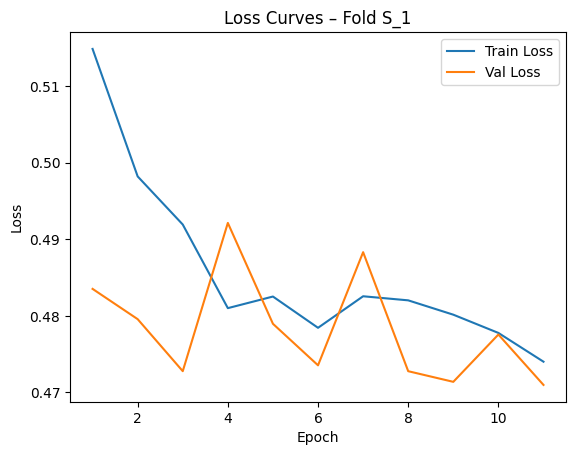

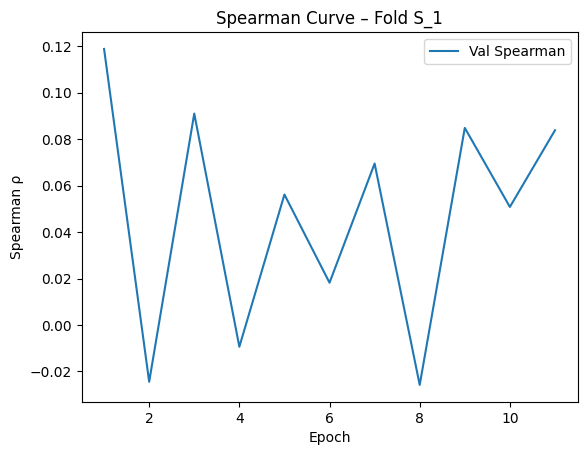


=== CV fold: validate on S_2 ===
Fold S_2 Ep01 | tr_loss=0.5087 | val_loss=0.5078 | val_spear=0.0714
Fold S_2 Ep02 | tr_loss=0.4904 | val_loss=0.5202 | val_spear=-0.0065
Fold S_2 Ep03 | tr_loss=0.4857 | val_loss=0.5017 | val_spear=0.0662
Fold S_2 Ep04 | tr_loss=0.4827 | val_loss=0.5134 | val_spear=0.0002
Fold S_2 Ep05 | tr_loss=0.4805 | val_loss=0.4988 | val_spear=0.0506
Fold S_2 Ep06 | tr_loss=0.4768 | val_loss=0.5155 | val_spear=0.0495
Fold S_2 Ep07 | tr_loss=0.4744 | val_loss=0.4912 | val_spear=0.0712
Fold S_2 Ep08 | tr_loss=0.4749 | val_loss=0.5134 | val_spear=0.0038
Fold S_2 Ep09 | tr_loss=0.4730 | val_loss=0.5096 | val_spear=0.0402
Fold S_2 Ep10 | tr_loss=0.4730 | val_loss=0.4899 | val_spear=0.1172
Fold S_2 Ep11 | tr_loss=0.4701 | val_loss=0.5046 | val_spear=0.0274
Fold S_2 Ep12 | tr_loss=0.4716 | val_loss=0.5059 | val_spear=0.0144
Fold S_2 Ep13 | tr_loss=0.4730 | val_loss=0.4979 | val_spear=0.0618
Fold S_2 Ep14 | tr_loss=0.4699 | val_loss=0.5009 | val_spear=0.0891
Fold S_2 Ep15

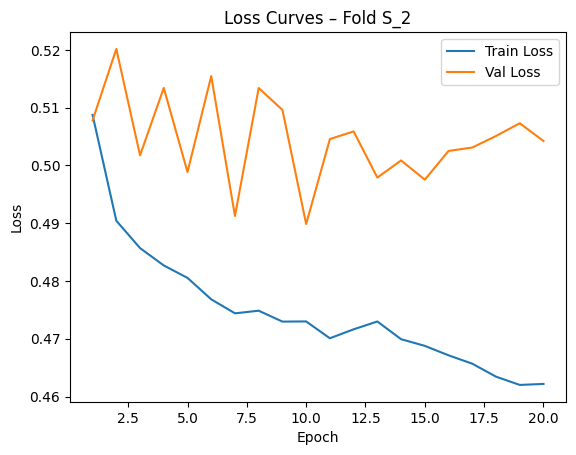

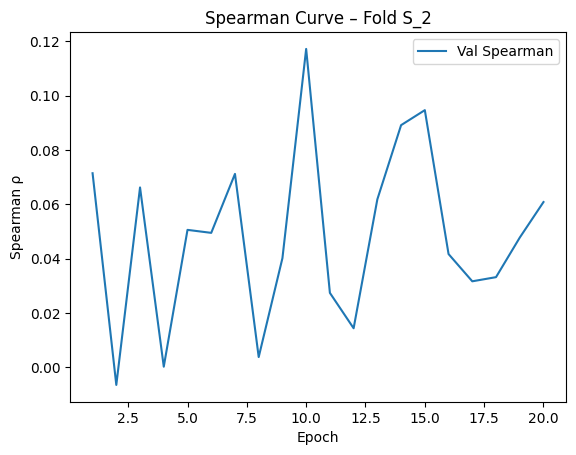


=== CV fold: validate on S_3 ===
Fold S_3 Ep01 | tr_loss=0.5077 | val_loss=0.5047 | val_spear=0.0714
Fold S_3 Ep02 | tr_loss=0.4873 | val_loss=0.5258 | val_spear=0.0323
Fold S_3 Ep03 | tr_loss=0.4904 | val_loss=0.5087 | val_spear=0.0348
Fold S_3 Ep04 | tr_loss=0.4854 | val_loss=0.4952 | val_spear=0.0776
Fold S_3 Ep05 | tr_loss=0.4788 | val_loss=0.4950 | val_spear=0.0917
Fold S_3 Ep06 | tr_loss=0.4777 | val_loss=0.4969 | val_spear=0.0530
Fold S_3 Ep07 | tr_loss=0.4806 | val_loss=0.4952 | val_spear=0.0373
Fold S_3 Ep08 | tr_loss=0.4736 | val_loss=0.4976 | val_spear=0.0885
Fold S_3 Ep09 | tr_loss=0.4741 | val_loss=0.4890 | val_spear=0.0972
Fold S_3 Ep10 | tr_loss=0.4731 | val_loss=0.5012 | val_spear=0.0215
Fold S_3 Ep11 | tr_loss=0.4694 | val_loss=0.4910 | val_spear=0.0780
Fold S_3 Ep12 | tr_loss=0.4744 | val_loss=0.4892 | val_spear=0.1059
Fold S_3 Ep13 | tr_loss=0.4736 | val_loss=0.4997 | val_spear=0.0473
Fold S_3 Ep14 | tr_loss=0.4759 | val_loss=0.4949 | val_spear=0.0873
Fold S_3 Ep15 

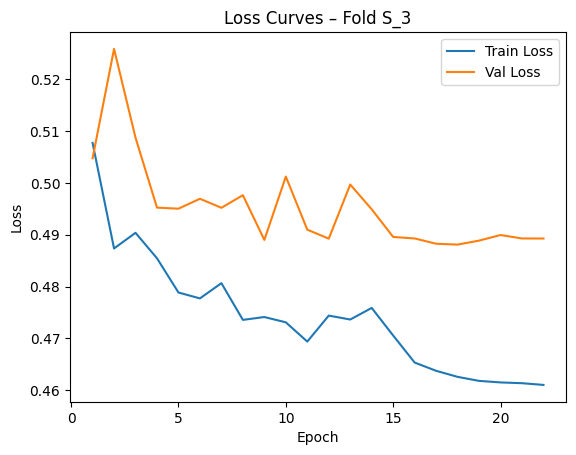

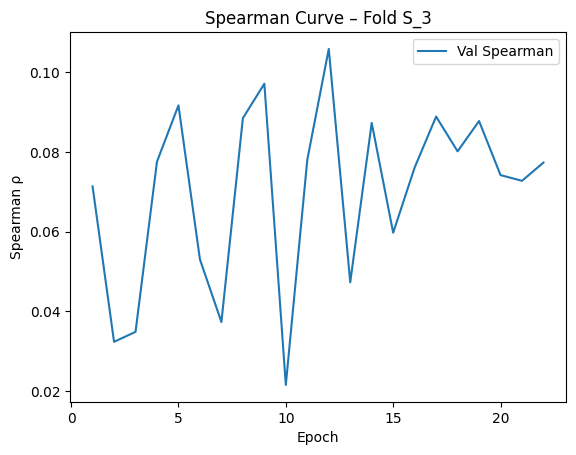


=== CV fold: validate on S_4 ===
Fold S_4 Ep01 | tr_loss=0.5155 | val_loss=0.4936 | val_spear=0.1517
Fold S_4 Ep02 | tr_loss=0.4988 | val_loss=0.4731 | val_spear=0.0536
Fold S_4 Ep03 | tr_loss=0.4927 | val_loss=0.4698 | val_spear=0.1454
Fold S_4 Ep04 | tr_loss=0.4845 | val_loss=0.4647 | val_spear=0.1466
Fold S_4 Ep05 | tr_loss=0.4828 | val_loss=0.4682 | val_spear=0.0991
Fold S_4 Ep06 | tr_loss=0.4871 | val_loss=0.4589 | val_spear=0.1935
Fold S_4 Ep07 | tr_loss=0.4779 | val_loss=0.4607 | val_spear=0.1512
Fold S_4 Ep08 | tr_loss=0.4792 | val_loss=0.4562 | val_spear=0.1935
Fold S_4 Ep09 | tr_loss=0.4778 | val_loss=0.4621 | val_spear=0.1894
Fold S_4 Ep10 | tr_loss=0.4779 | val_loss=0.4563 | val_spear=0.1614
Fold S_4 Ep11 | tr_loss=0.4850 | val_loss=0.4599 | val_spear=0.1292
Fold S_4 Ep12 | tr_loss=0.4846 | val_loss=0.4701 | val_spear=0.1006
Fold S_4 Ep13 | tr_loss=0.4799 | val_loss=0.4547 | val_spear=0.2060
Fold S_4 Ep14 | tr_loss=0.4784 | val_loss=0.4622 | val_spear=0.2138
Fold S_4 Ep15 

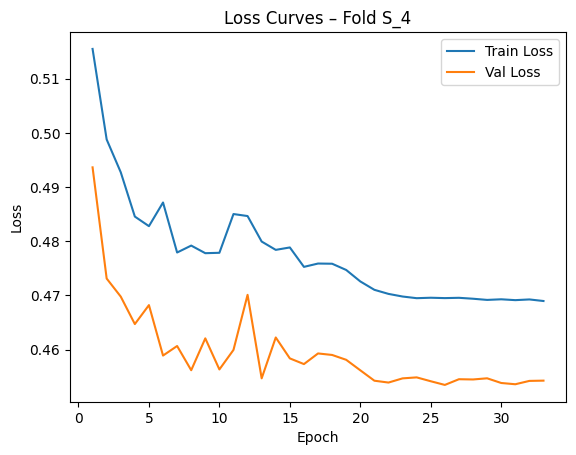

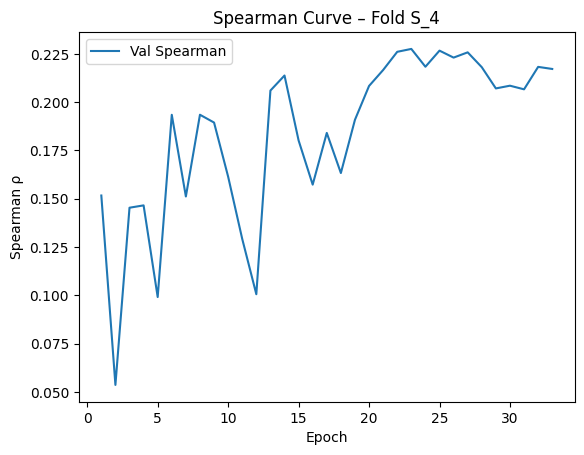


=== CV fold: validate on S_5 ===
Fold S_5 Ep01 | tr_loss=0.5262 | val_loss=0.4195 | val_spear=0.1757
Fold S_5 Ep02 | tr_loss=0.5073 | val_loss=0.4283 | val_spear=0.0840
Fold S_5 Ep03 | tr_loss=0.5010 | val_loss=0.4385 | val_spear=-0.0210
Fold S_5 Ep04 | tr_loss=0.5030 | val_loss=0.4230 | val_spear=0.0438
Fold S_5 Ep05 | tr_loss=0.4983 | val_loss=0.4161 | val_spear=0.1374
Fold S_5 Ep06 | tr_loss=0.4951 | val_loss=0.4182 | val_spear=0.0658
Fold S_5 Ep07 | tr_loss=0.4894 | val_loss=0.4270 | val_spear=0.0198
Fold S_5 Ep08 | tr_loss=0.4916 | val_loss=0.4088 | val_spear=0.1690
Fold S_5 Ep09 | tr_loss=0.4936 | val_loss=0.4179 | val_spear=0.1363
Fold S_5 Ep10 | tr_loss=0.4898 | val_loss=0.4206 | val_spear=0.0654
Fold S_5 Ep11 | tr_loss=0.4900 | val_loss=0.4114 | val_spear=0.0781


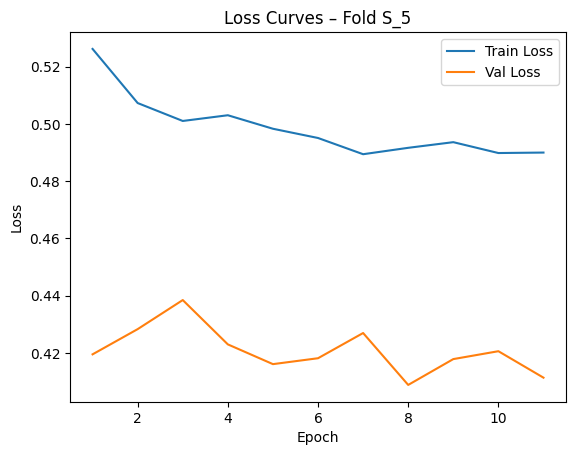

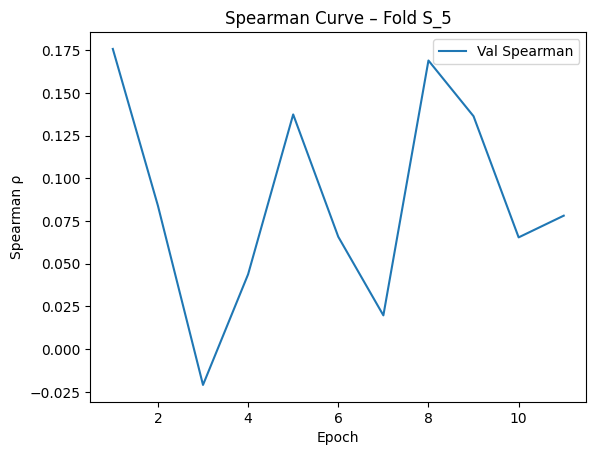


=== CV fold: validate on S_6 ===
Fold S_6 Ep01 | tr_loss=0.5025 | val_loss=0.5413 | val_spear=0.1098
Fold S_6 Ep02 | tr_loss=0.4872 | val_loss=0.5605 | val_spear=0.0500
Fold S_6 Ep03 | tr_loss=0.4804 | val_loss=0.5473 | val_spear=0.0370
Fold S_6 Ep04 | tr_loss=0.4763 | val_loss=0.5381 | val_spear=0.1446
Fold S_6 Ep05 | tr_loss=0.4736 | val_loss=0.5569 | val_spear=0.0134
Fold S_6 Ep06 | tr_loss=0.4717 | val_loss=0.5449 | val_spear=0.0736
Fold S_6 Ep07 | tr_loss=0.4684 | val_loss=0.5419 | val_spear=0.0934
Fold S_6 Ep08 | tr_loss=0.4641 | val_loss=0.5341 | val_spear=0.0963
Fold S_6 Ep09 | tr_loss=0.4624 | val_loss=0.5408 | val_spear=0.0731
Fold S_6 Ep10 | tr_loss=0.4629 | val_loss=0.5360 | val_spear=0.1069
Fold S_6 Ep11 | tr_loss=0.4636 | val_loss=0.5368 | val_spear=0.1109
Fold S_6 Ep12 | tr_loss=0.4625 | val_loss=0.5372 | val_spear=0.0857
Fold S_6 Ep13 | tr_loss=0.4617 | val_loss=0.5308 | val_spear=0.1468
Fold S_6 Ep14 | tr_loss=0.4606 | val_loss=0.5350 | val_spear=0.1084
Fold S_6 Ep15 

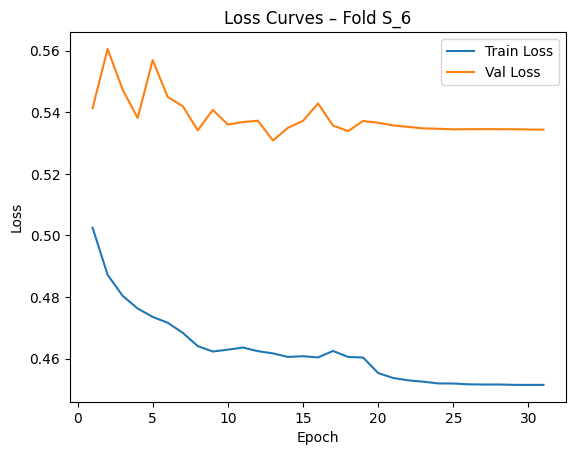

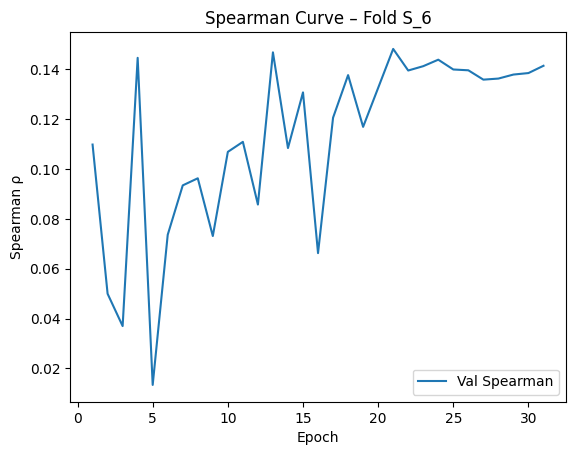


→ Loading fold S_1 best model

→ Loading fold S_2 best model

→ Loading fold S_3 best model

→ Loading fold S_4 best model

→ Loading fold S_5 best model

→ Loading fold S_6 best model
Saved submission.csv


ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

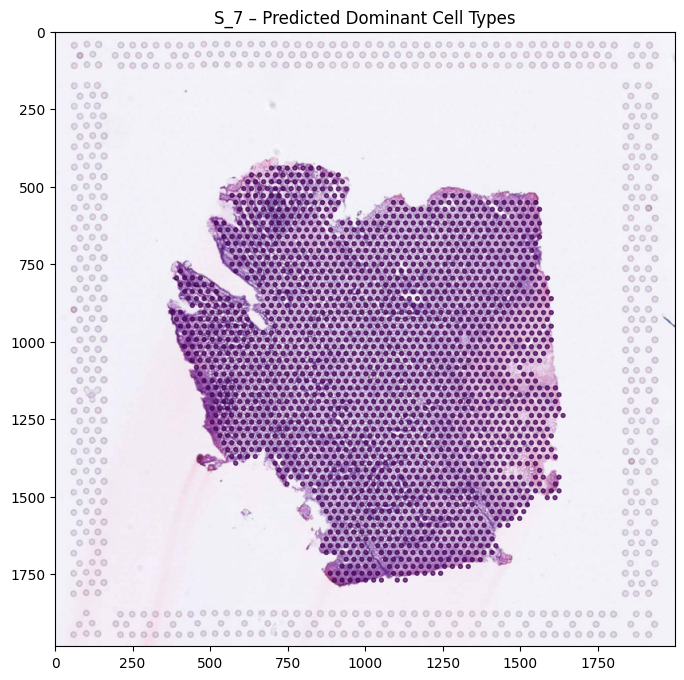

In [21]:
########################
# 8. Orchestrate Runs  #
########################
def main():
    # 1) Load data
    tr_imgs, tr_sp, te_imgs, te_sp = load_h5(CFG.DATA_PATH)
    
    # 2) Features
    train_feats, test_feats = precompute_features(tr_imgs, tr_sp, te_imgs, te_sp)

    SLIDES = list(train_feats.keys()) + list(test_feats.keys())
    slide2idx = {s:i for i,s in enumerate(SLIDES)}

    for s in train_feats:
        train_feats[s]['slide_idx'] = slide2idx[s]
    for s in test_feats:
        test_feats[s]['slide_idx'] = slide2idx[s]

    # 3) Graphs
    adjs = {s: build_adj(obj['coords'], CFG.K_NEIGHBORS) for s,obj in train_feats.items()}
    adjs.update({s: build_adj(obj['coords'], CFG.K_NEIGHBORS) for s,obj in test_feats.items()})

    # 4) Cross-validation: leave-one-slide-out
    dim   = next(iter(train_feats.values()))['x'].shape[1]
    crit  = CombinedLoss(alpha=0.5, reg=1.0)
    cv_scores = {}

    for val_slide in train_feats.keys():
        print(f"\n=== CV fold: validate on {val_slide} ===")

        # NEW: lists to record metrics
        tr_losses, val_losses, val_spears = [], [], []

        model = GraphNet(dim, CFG.HIDDEN_DIM, CFG.GNN_LAYERS, 35, CFG.DROPOUT).to(CFG.DEVICE)
        opt   = torch.optim.AdamW(model.parameters(), lr=CFG.LR, weight_decay=CFG.WEIGHT_DECAY)
        sched = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode='min', factor=0.1, patience=5)

        train_slides = [s for s in train_feats if s != val_slide]
        train_ds     = SlideDataset(train_feats, adjs, train_slides)
        val_ds       = SlideDataset(train_feats, adjs, [val_slide])
        train_ld     = DataLoader(train_ds, batch_size=1, shuffle=True)
        val_ld       = DataLoader(val_ds,   batch_size=1, shuffle=False)

        best_sp, no_imp = -1, 0
        for ep in range(1, CFG.EPOCHS+1):
            tr_l = train_loop(model, train_ld, opt, crit, ep)

            # run validation
            v_losses, v_spears = [], []
            for x, coords, adj, slide_idx, y in val_ld:
                l, s = val_step(model, x, coords, adj, slide_idx, y, crit)
                v_losses.append(l); v_spears.append(s)
            v_l = float(np.mean(v_losses)); v_sp = float(np.mean(v_spears))

            # NEW: record
            tr_losses.append(tr_l)
            val_losses.append(v_l)
            val_spears.append(v_sp)

            sched.step(v_l)
            print(f"Fold {val_slide} Ep{ep:02d} | tr_loss={tr_l:.4f} | val_loss={v_l:.4f} | val_spear={v_sp:.4f}")

            if v_sp > best_sp + 1e-6:
                best_sp, no_imp = v_sp, 0
                torch.save(model.state_dict(), CFG.CACHE_DIR/f"best_{val_slide}.pt")
            else:
                no_imp += 1
                if no_imp >= 10:
                    break

        cv_scores[val_slide] = best_sp

        # NEW: after each fold, plot & save
        epochs = list(range(1, len(tr_losses)+1))

        plt.figure()
        plt.plot(epochs, tr_losses, label='Train Loss')
        plt.plot(epochs, val_losses, label='Val Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title(f'Loss Curves – Fold {val_slide}')
        plt.legend()
        plt.show()

        plt.figure()
        plt.plot(epochs, val_spears, label='Val Spearman')
        plt.xlabel('Epoch')
        plt.ylabel('Spearman ρ')
        plt.title(f'Spearman Curve – Fold {val_slide}')
        plt.legend()
        plt.show()
   
    # 5) Ensemble predictions from all CV‐fold models
    slide = list(test_feats.keys())[0]
    # when doing stratified CV, our cv_scores are keyed by fold index 0..CV_FOLDS-1
    folds = list(cv_scores.keys())
    # build weight vector from CV Spearman scores
    scores = np.array([cv_scores[f] for f in folds], dtype=np.float32)
    weights = scores / scores.sum()
    preds = []
    for weight, fold in zip(weights, folds):
        print(f"\n→ Loading fold {fold} best model")
        if CFG.USE_GNN:
            model = GraphNet(dim, CFG.HIDDEN_DIM, CFG.GNN_LAYERS, 35, CFG.DROPOUT)
        else:
            model = MLPHead(dim, CFG.HIDDEN_DIM, 35)
        model.to(CFG.DEVICE)
        # if MLP: we saved best_fold{fold}.pt
        # if GNN: we saved best_{slide_name}.pt, so your cv_scores keys will be slide names
        ckpt = f"best_fold{fold}.pt" if not CFG.USE_GNN else f"best_{fold}.pt"
        model.load_state_dict(torch.load(CFG.CACHE_DIR/ckpt))

        with torch.no_grad():
            if CFG.USE_GNN:
                x0      = torch.from_numpy(test_feats[slide]['x']).to(CFG.DEVICE)
                adj     = adjs[slide].to(CFG.DEVICE)
                coords  = torch.from_numpy(test_feats[slide]['coords']).to(CFG.DEVICE)
                slide_idx = torch.full((x0.size(0),), test_feats[slide]['slide_idx'],
                                       dtype=torch.long, device=CFG.DEVICE)
                out = model(x0, adj, coords, slide_idx).cpu().numpy()
            else:
                X_test = torch.from_numpy(test_feats[slide]['x']).float().to(CFG.DEVICE)
                out = model(X_test).cpu().numpy()
            # weight this fold’s prediction
            preds.append(out * weight)

    # average across folds
    pred = np.sum(preds, axis=0)

    # 7) Submission (unchanged)
    ids  = te_sp[slide]['ID'] if 'ID' in te_sp[slide].dtype.names else np.arange(len(te_sp[slide]))
    cols = [f"C{i}" for i in range(1,36)]
    df   = pd.DataFrame(pred, columns=cols)
    df = -df # somehow the results are all negative values, so we convert them to positive here
    df.insert(0, 'ID', ids)
    df.to_csv(CFG.SUBMISSION_FILE, index=False)
    print(f"Saved {CFG.SUBMISSION_FILE}")

        # 8) Visualize predicted cell types on each test slide
    import matplotlib.cm as cm
    # load submission
    pred_df = pd.read_csv(CFG.SUBMISSION_FILE)

    for slide in test_feats:
        img   = te_imgs[slide]
        spots = te_sp[slide]                         # <- te_sp, not te_spots
        # preserve spot order via ID if present
        if 'ID' in spots.dtype.names:
            ids = spots['ID']
            sub = pred_df.set_index('ID').reindex(ids)
        else:
            ids = np.arange(len(spots))
            sub = pred_df.copy().iloc[: len(ids)].set_index(pred_df.index[:len(ids)])

        # pull out the 35 columns in order
        preds_np = sub[[f"C{i}" for i in range(1,36)]].values
        dom_pred = preds_np.argmax(axis=1)

        # get your shift (either from shifts dict above or CFG.SHIFTS)
        dx, dy = CFG.SHIFTS.get(slide, (0,0))

        plt.figure(figsize=(8,8))
        plt.imshow(img)
        plt.scatter(
            spots["x"] + dx,
            spots["y"] + dy,
            c=dom_pred,
            cmap="viridis",
            s=8,
            alpha=0.7
        )
        plt.title(f"{slide} – Predicted Dominant Cell Types")
        cbar = plt.colorbar(
            cm.ScalarMappable(
                cmap="viridis",
                norm=plt.Normalize(0, 34)
            ),
            fraction=0.046, pad=0.04
        )
        cbar.set_label("Predicted Cell Type C1–C35", rotation=270, labelpad=20)
        plt.axis("off")
        plt.show()

if __name__=="__main__": main()